In [ ]:
pip install talib

In [ ]:
pip install yfinance

# Extract list of all "Communication Service" shares in NYSE

In [1]:
import yfinance as yf
import pandas as pd

payload=pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
first_table = payload[0]
second_table = payload[1]

df = first_table
tech=df[df["GICS Sector"]=='Communication Services']
e=tech["Symbol"].unique().tolist()
data = yf.download(e, period="10y",
        group_by='ticker', actions=False)
data=data.reset_index()
data.to_excel("stocks.xlsx")

[*********************100%***********************]  26 of 26 completed


# Import data and a little bit of preprocessing

In [1]:
import talib
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn
import warnings
warnings.filterwarnings("ignore")

df=pd.read_excel('stocks.xlsx', header=[0, 1])
df.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
df[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(df[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
df.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
df.index.name = None  # rename the index
stock_names=[]
for i in range(df.columns.shape[0]):
    if i%6==1:
        stock_names.append(df.columns[i][0])
data=df.copy()
data.reset_index(drop=True, inplace=True)

# Missing value checking

In [2]:
for i in stock_names:
    if data[i].isnull().sum()[0]!=0:
        stock_names.remove(i)
len(stock_names)        

20

# calculate daily and cumulative return of each share

In [3]:
def calculate_return(stock):
    stock["Daily return"]=0
    stock["Cumulative return"]=100
    stock["Cumulative return"].iloc[0]=100
    for i in range(1,len(stock)):
        if stock["Close"].iloc[i-1]>-100:
            stock["Daily return"].iloc[i]=(stock["Close"].iloc[i]-stock["Close"].iloc[i-1])/stock["Close"].iloc[i-1]
            stock["Cumulative return"].iloc[i]=stock["Cumulative return"].iloc[i-1]*(1+stock["Daily return"].iloc[i])
        else:
            stock["Daily return"].iloc[i]=0
            stock["Cumulative return"].iloc[i]=100
    return stock
returns=pd.DataFrame()
for i in stock_names:
    print(i)
    r=calculate_return(data[i])
    returns[i+" Daily return"]=r["Daily return"].copy()
    returns[i+" Cumulative return"]=r["Cumulative return"].copy()


VIAC
GOOG
ATVI
CHTR
DIS
GOOGL
TMUS
LUMN
DISH
CMCSA
IPG
T
DISCA
LYV
OMC
NFLX
TTWO
VZ
EA
DISCK


# data normalizing

In [4]:
def normalize_data(stock_data):
    sc = MinMaxScaler(feature_range = (0, 1))
    training_set_scaled = sc.fit_transform(stock_data,)
    scaled_stock = pd.DataFrame(training_set_scaled,columns=stock_data.columns)
    return scaled_stock
scaled_dataset = data.copy()
for i in stock_names:
    r=normalize_data(data[i])
    scaled_dataset[i]=r.values
#add date feature to returns dataset    
returns["Date"]=data['Date'].values.reshape(-1)

# A little bit of visualization

In [38]:
fig = go.Figure()
for i in stock_names:
    fig.add_trace(go.Scatter(x=returns['Date'], y=returns[i+" Cumulative return"],
                    mode='lines',
                    name=i))
    fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))
fig.update_layout(title_text="Portfolio value if you bought 100$ share on july 2011", xaxis=dict(title="Date"),
    yaxis=dict(title="Portfolio value")) 
fig.show()

fig = go.Figure()
for i in stock_names:
    fig.add_trace(go.Scatter(x=returns['Date'], y=returns[i+" Daily return"]*100,
                    mode='lines',
                    name=i))
    fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))
fig.update_layout(title_text="Daily return of stocks", xaxis=dict(title="Date"),
    yaxis=dict(title="Daily return of stocks")) 
fig.show()


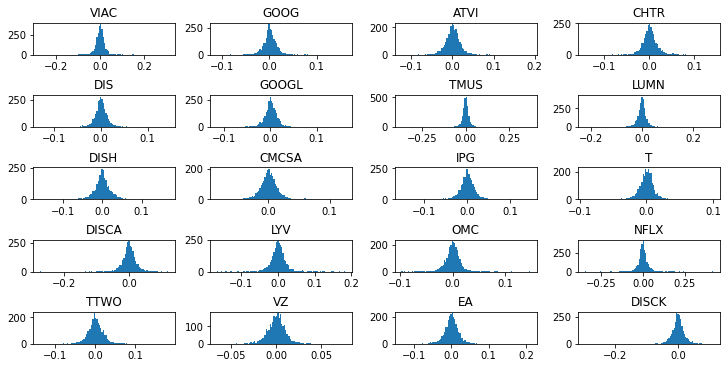

In [42]:
plt.rcParams["figure.figsize"] = (10, 5)
fig, axes = plt.subplots(5, 4, constrained_layout=True)
i=0
for row in range(5):
    for col in range(4):
        if i<20:
            axes[row,col].hist(returns[stock_names[i]+" Daily return"],bins=100)
            axes[row,col].title.set_text(stock_names[i])
            i+=1  
        else:
            pass

As you can see, distribution of daily return of stocks is roughly normal distribution.

In [5]:
plt.rcParams["figure.figsize"] = (14, 9)

fig = go.Figure()
for i in stock_names:
    fig.add_trace(go.Scatter(x=returns['Date'], y=scaled_dataset[i]['Close'],
                    mode='lines',
                    name=i))   

fig.update_layout(title="Normalized close price of stocks per date", xaxis=dict(title="Date"),
    yaxis=dict(title="Normalized Price")) 

fig.show()


# Correlation analysis of lagged stock prices

<Figure size 432x288 with 0 Axes>

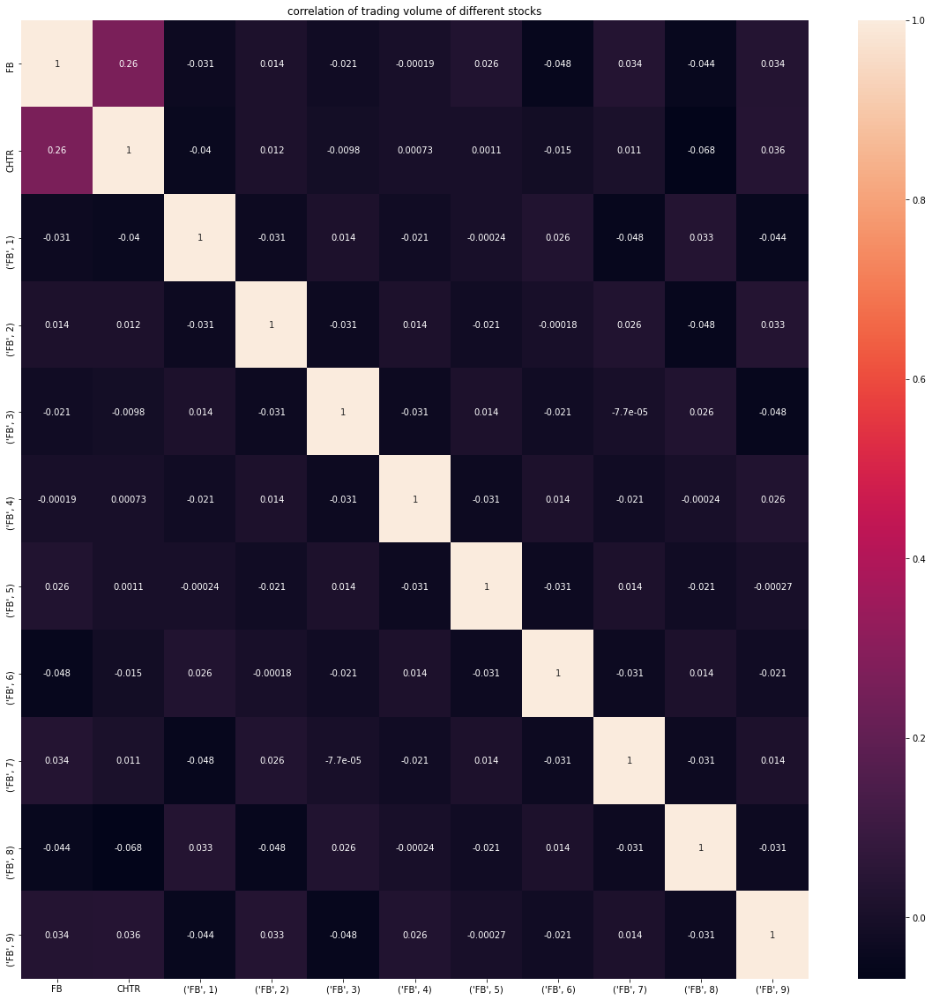

<Figure size 432x288 with 0 Axes>

In [28]:
import seaborn

log_check=["EA","ATVI","CMCSA","CHTR","FB","GOOG","TMUS","LYV"]
log_check=["FB","CHTR"]
r=pd.DataFrame()
for i in log_check:
    r[i]=returns[i+" Daily return"]
for a in range(1,10):
    r[log_check[0],a] = r[log_check[0]].shift(a)
corr_df = r.corr(method='pearson')
plt.figure(figsize=(20, 20))
seaborn.heatmap(corr_df, annot=True)
plt.title("correlation of trading volume of different stocks")
plt.figure()

# Correlation analysis of stock volumes

<Figure size 720x360 with 0 Axes>

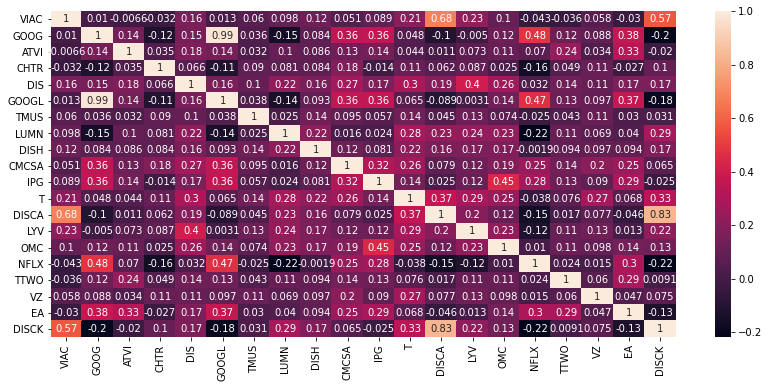

<Figure size 720x360 with 0 Axes>

In [45]:
matrix=np.zeros((data.shape[0],len(stock_names)))
for i in range(len(stock_names)):
    matrix[:,i]=scaled_dataset[stock_names[i]]["Volume"]
matrix=pd.DataFrame(matrix,columns=stock_names)    
corr_df = matrix.corr(method='pearson')
plt.figure(figsize=(14, 6))
seaborn.heatmap(corr_df, annot=True)
plt.title("correlation of trading volume of different stocks")
plt.figure()

# Adding some technical indicators to data

In [4]:
def calculate_indicator(stock):
    close=stock['Close']
    high=stock['High']
    low=stock['Low']
    open=stock['Open']
    volume=stock['Volume']
    
    indicators=pd.DataFrame()
    indicators["MA_5"]= talib.MA(close, timeperiod=5, matype=0)
    indicators["MA_10"]= talib.MA(close, timeperiod=10, matype=0)
    indicators["MA_20"]= talib.MA(close, timeperiod=20, matype=0)
    indicators["MA_50"]= talib.MA(close, timeperiod=50, matype=0)
    indicators["ad"]=talib.AD(high, low, close, volume)
    indicators["atr"]=talib.ATR(high, low, close, timeperiod=14)
    indicators["upperband"], indicators["middleband"], indicators["lowerband"] = talib.BBANDS(close, timeperiod=5, nbdevup=2, nbdevdn=2, matype=0)
    
    indicators["macd"], indicators["macdsignal"], indicators["macdhist"]= talib.MACD(close, fastperiod=12, slowperiod=26, signalperiod=9)
    indicators["rsi"] = talib.RSI(close, timeperiod=14)
    indicators["slowk"], indicators["slowd"] = talib.STOCH(high, low, close, fastk_period=5, slowk_period=3, slowk_matype=0, slowd_period=3, slowd_matype=0)
    indicators["mfi"] = talib.MFI(high, low, close, volume, timeperiod=14)
    indicators["adx"] = talib.ADX(high, low, close, timeperiod=14)
    indicators["cci"] = talib.CCI(high, low, close, timeperiod=14)
    indicators["mom"] = talib.MOM(close, timeperiod=10)
    indicators["R%"] = talib.WILLR(high, low, close, timeperiod=14)
    return indicators

t=["Open","High","Low","Close","adj_close","Volume"]
for i in r.columns:
    t.append(i) 
y={}
for i in stock_names:    
    r=(calculate_indicator(data[i]))
    y[i]=pd.concat([data[i],r],axis=1)
    
data_with_indic=pd.concat(y, axis=1)
data_with_indic["GOOG"]

,Open,High,Low,Close,Adj Close,Volume,MA_5,MA_10,MA_20,MA_50,...,macdsignal,macdhist,rsi,slowk,slowd,mfi,adx,cci,mom,R%
0,304.468781,306.600800,298.471252,302.252075,302.252075,7961932.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,301.868530,303.696655,294.680450,295.093903,295.093903,6425193.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,296.025421,300.374115,290.725281,299.462555,299.462555,7680079.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,296.139984,298.306885,287.656799,287.681702,287.681702,9866042.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,290.182312,293.898407,279.950684,288.438873,288.438873,11902647.0,294.585822,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2512,2765.000000,2794.260010,2753.020020,2792.889893,2792.889893,1150600.0,2697.964014,2659.867993,2612.339502,2514.572402,...,46.543520,12.323007,78.212154,95.381150,91.787424,76.246458,25.868535,239.822832,181.609863,-0.586875
2513,2800.219971,2800.219971,2702.000000,2735.929932,2735.929932,2091200.0,2720.743994,2671.471997,2622.316504,2522.967803,...,49.307790,11.057081,67.039810,85.174728,92.005726,63.208370,25.930853,135.694462,116.040039,-26.852418
2514,2771.239990,2793.520020,2727.000000,2727.629883,2727.629883,2734400.0,2735.867969,2680.069995,2632.679492,2531.092202,...,51.483983,8.704772,65.569968,72.499716,84.351865,73.513331,25.988721,110.240861,85.979980,-31.632427
2515,2727.612061,2743.030029,2722.760010,2730.810059,2730.810059,964200.0,2748.715967,2690.617993,2643.903992,2539.639805,...,53.110897,6.507654,65.878656,50.932819,69.535755,67.828923,25.921505,72.247004,105.479980,-30.246609


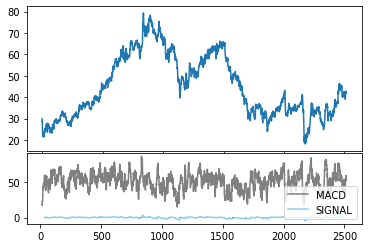

<Figure size 3600x3600 with 0 Axes>

In [7]:
def plot_macd(prices, macd, signal, hist):
    
    ax1 = plt.subplot2grid((15,1), (0,0), rowspan = 10, colspan = 1)
    ax2 = plt.subplot2grid((15,1), (10,0), rowspan = 5, colspan = 1)

    ax1.plot(prices)
    ax2.plot(macd, color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(signal, color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(prices)):
        if str(hist[i])[0] == '-':
            ax2.bar(prices.index[i], hist[i], color = '#ef5350')
        else:
            ax2.bar(prices.index[i], hist[i], color = '#26a69a')

    plt.legend(loc = 'lower right')
    plt.figure(figsize=(50, 50))

plot_macd(data_with_indic["DISH"]['Close'],data_with_indic["DISH"]["rsi"], data_with_indic["DISH"]["macdsignal"], data_with_indic["DISH"]["macdhist"])

# Adding candlestick patterns

In [8]:
candle_names = talib.get_function_groups()['Pattern Recognition']
y={}
r=pd.DataFrame()
# create columns for each pattern
for i in stock_names:
    for candle in candle_names:    
        r[candle] = getattr(talib, candle)(data[i]["Open"],data[i]["High"], data[i]["Low"], data[i]["Close"])
        y[i]=pd.concat([data_with_indic[i],r],axis=1)
data_with_patterns=pd.concat(y, axis=1) 
data_with_patterns["Date"]=data['Date'].values.reshape(-1)
returns["Date"]=data['Date'].values.reshape(-1)

In [17]:
y={}
u=["TTWO"]
num=np.zeros((len(u),data.shape[0]))
for i in range(len(u)):
    y[u[i]]=data_with_patterns[u[i]].iloc[:,26:]
    for k in range(y[u[i]].shape[0]):
        for j in range(y[u[i]].shape[1]):
            if y[u[i]].iloc[k,j]!=0:
                num[i,k]+=1 

(array([535., 763.,   0., 559.,   0., 169.,   0., 113.,   0., 185., 106.,
          0.,  56.,   0.,  22.,   0.,   7.,   0.,   1.,   1.]),
 array([ 0.  ,  0.55,  1.1 ,  1.65,  2.2 ,  2.75,  3.3 ,  3.85,  4.4 ,
         4.95,  5.5 ,  6.05,  6.6 ,  7.15,  7.7 ,  8.25,  8.8 ,  9.35,
         9.9 , 10.45, 11.  ]),
 <BarContainer object of 20 artists>)

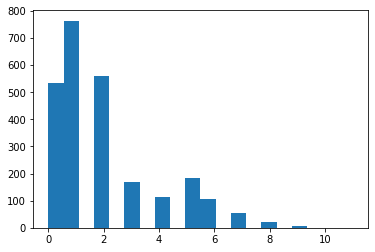

In [32]:
w=pd.DataFrame(returns["TTWO Daily return"])
condlist = [
    (returns["TTWO Daily return"] <= 0),
    (returns["TTWO Daily return"] >0)
    ]
choicelist = [-1,1]
  
gfg = np.select(condlist, choicelist)
w["TTWO Daily return"]=gfg
w["#ofpatterns"]=num[0]
plt.hist(w["#ofpatterns"],bins=20)
plt.show()

# Extract strong frequent canndlestick patterns for each stock

In [11]:
def strong_patterns(stock):
    r=data_with_patterns[stock].iloc[:,26:]
    new_patterns={}

    r["return"]=returns[stock+" Daily return"]
    for j in range(r.shape[1]):
        conf=(r[r.iloc[:,j]!=0].iloc[:,j]*r[r.iloc[:,j]!=0].iloc[:,-1].shift(1))  

        if conf.shape[0]!=0:
            new_patterns[r.columns[j]+"confidence"]=conf[conf>0].shape[0]/conf.shape[0]
            new_patterns[r.columns[j]+"support"]=conf.shape[0]
        else:
            new_patterns[r.columns[j]+"confidence"]=0        
            new_patterns[r.columns[j]+"support"]=0
    for i in candle_names:
        if new_patterns[i+"confidence"]>0.6:
            print(i,new_patterns[i+"confidence"],new_patterns[i+"support"])   


In [12]:
y={}
stock=["TTWO","NFLX","EA","DISH","VZ","LUMN"]
for s in stock:
    print(s)
    strong_patterns(s)
            
pat=["CDLHOMINGPIGEON","CDLDARKCLOUDCOVER","CDLEVENINGSTAR","CDLMORNINGDOJISTAR","CDLMORNINGSTAR"]
y["TTWO"]=pd.concat([data_with_patterns["TTWO"].iloc[:,:26],data_with_patterns["TTWO"][pat]],axis=1)

pat=["CDL3INSIDE","CDLDARKCLOUDCOVER","CDLDRAGONFLYDOJI","CDLHOMINGPIGEON","CDLTAKURI"]
y["NFLX"]=pd.concat([data_with_patterns["NFLX"].iloc[:,:26],data_with_patterns["NFLX"][pat]],axis=1)

pat=["CDLDARKCLOUDCOVER","CDLEVENINGSTAR","CDLHOMINGPIGEON","CDLXSIDEGAP3METHODS","CDLPIERCING"]
y["EA"]=pd.concat([data_with_patterns["EA"].iloc[:,:26],data_with_patterns["EA"][pat]],axis=1)

pat=["CDLDARKCLOUDCOVER","CDLDRAGONFLYDOJI","CDLHOMINGPIGEON","CDLMORNINGSTAR","CDLTAKURI"]
y["DISH"]=pd.concat([data_with_patterns["DISH"].iloc[:,:26],data_with_patterns["DISH"][pat]],axis=1)

pat=["CDLDRAGONFLYDOJI","CDLEVENINGSTAR","CDLHOMINGPIGEON","CDLMORNINGSTAR","CDLTAKURI"]
y["VZ"]=pd.concat([data_with_patterns["VZ"].iloc[:,:26],data_with_patterns["VZ"][pat]],axis=1)

pat=["CDLDARKCLOUDCOVER","CDLDRAGONFLYDOJI","CDLEVENINGSTAR","CDLHOMINGPIGEON","CDLTAKURI"]
y["LUMN"]=pd.concat([data_with_patterns["LUMN"].iloc[:,:26],data_with_patterns["LUMN"][pat]],axis=1)
other=[item for item in stock_names if item not in stock]
for s in other:
    y[s]=data_with_patterns[s]
data_with_patterns=pd.concat(y, axis=1)
    

TTWO
CDLDARKCLOUDCOVER 0.9285714285714286 14
CDLEVENINGSTAR 0.9333333333333333 15
CDLHOMINGPIGEON 0.9722222222222222 36
CDLMORNINGDOJISTAR 0.8888888888888888 9
CDLMORNINGSTAR 0.9333333333333333 15
CDLONNECK 0.6666666666666666 3
CDLPIERCING 0.8 5
CDLUNIQUE3RIVER 0.75 8
NFLX
CDL3INSIDE 0.6578947368421053 38
CDLDARKCLOUDCOVER 0.9230769230769231 13
CDLDRAGONFLYDOJI 0.6666666666666666 30
CDLEVENINGSTAR 0.9 10
CDLHOMINGPIGEON 0.9655172413793104 29
CDLLADDERBOTTOM 0.6666666666666666 3
CDLMORNINGSTAR 0.875 8
CDLONNECK 0.6666666666666666 3
CDLPIERCING 0.9230769230769231 13
CDLTAKURI 0.6666666666666666 30
CDLTASUKIGAP 0.6111111111111112 18
EA
CDLDARKCLOUDCOVER 0.9090909090909091 11
CDLEVENINGDOJISTAR 0.875 8
CDLEVENINGSTAR 0.9473684210526315 19
CDLHOMINGPIGEON 0.9705882352941176 34
CDLLADDERBOTTOM 0.75 4
CDLMORNINGDOJISTAR 0.6666666666666666 3
CDLMORNINGSTAR 0.8888888888888888 9
CDLONNECK 0.8571428571428571 7
CDLPIERCING 0.9 10
CDLTRISTAR 0.6666666666666666 3
CDLXSIDEGAP3METHODS 0.61111111111111

# Distribution of patterns in each day

In This section distribution of candlestick patterns are shown. By distribution I mean probability of 1  candlestick pattern occurrence in a single day, 2 candlestick patterns occurrence in a single day and so on. 
According to the plots, for most days there is one candlestick pattern which means there is a chance of downtrend or uptrend for next days. Days with 0 or 2 different candlestick pattern are common as well. A more detailed analysis can be done on candlestick patterns   

In [14]:
y={}
num=np.zeros((len(stock_names),data.shape[0]))
for i in range(len(stock_names)):
    y[stock_names[i]]=data_with_patterns[stock_names[i]].iloc[:,26:]
    for k in range(y[stock_names[i]].shape[0]):
        for j in range(y[stock_names[i]].shape[1]):
            if y[stock_names[i]].iloc[k,j]!=0:
                num[i,k]+=1 

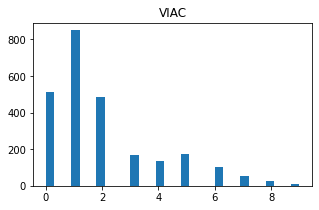

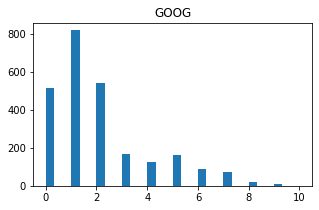

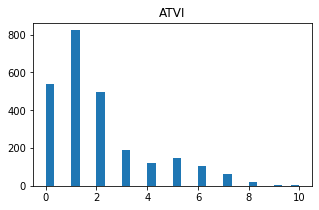

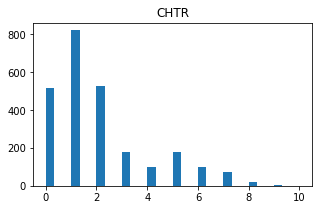

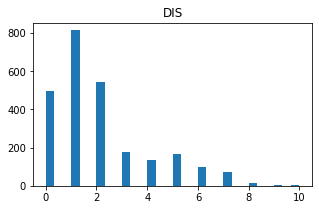

...

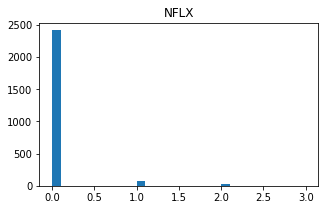

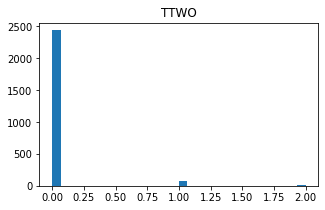

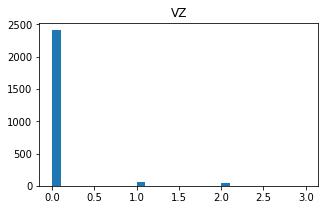

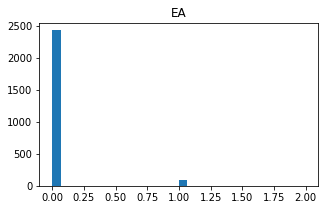

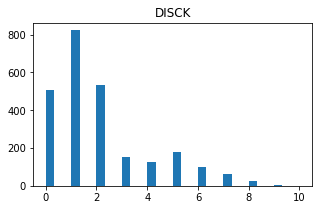

IndexError: index 20 is out of bounds for axis 0 with size 20

In [15]:
plt.rcParams["figure.figsize"] = (5,3)

for i in range(26):
    plt.hist(num[i],bins=30)
    plt.title(stock_names[i])
    plt.show()

# Export data to a excel sheet

In [16]:
for i in stock_names:
    data_with_patterns[i].to_csv("{}.csv".format(i))